In [1]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image, UnidentifiedImageError
from sklearn.model_selection import train_test_split
import torchvision.models as models
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, f1_score, recall_score, precision_score
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_curve, roc_auc_score
import seaborn as sns
import time

In [2]:
data_path = "C:\\Users\\serdi\\Desktop\\Flood_Detection_Final_Project"
class_names = ["Flood", "Not_Flood"]
X, y = [], []

for class_name in class_names:
    class_path = os.path.join(data_path, class_name)
    for image_path in os.listdir(class_path):
        try:
            img = Image.open(os.path.join(class_path, image_path))
            img = img.convert('RGB')
            img = img.resize((224, 224))
            img_array = np.array(img)
            X.append(img_array)
            y.append(0 if class_name == "Flood" else 1)
        except UnidentifiedImageError:
            print(f"Invalid image file: {os.path.join(class_path, image_path)}")

X = np.array(X)
y = np.array(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, stratify=y_train, random_state=42)


In [3]:
class FloodDataset(Dataset):
    def __init__(self, X, y, transform=None):
        self.X = X
        self.y = y
        self.transform = transform

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        img = self.X[idx]
        label = self.y[idx]

        # Convert the image to grayscale
        img = Image.fromarray(img).convert('L')

        if self.transform:
            img = self.transform(img)

        # Convert the label to a torch tensor
        return img, torch.tensor(label, dtype=torch.long)

In [4]:
transform_train = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(45),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485], std=[0.229])
])

transform_val_test = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485], std=[0.229])
])

train_dataset = FloodDataset(X_train, y_train, transform=transform_train)
val_dataset = FloodDataset(X_val, y_val, transform=transform_val_test)
test_dataset = FloodDataset(X_test, y_test, transform=transform_val_test)

train_loader = DataLoader(train_dataset, batch_size=60, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=60, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=60, shuffle=False)

In [5]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Model
resnet50 = models.resnet50(pretrained=True)

# Özgün ResNet50 modelinin son katmanını kullanarak özel bir katman ekleyin
num_ftrs = resnet50.fc.in_features
resnet50.fc = nn.Linear(num_ftrs, 2)

resnet50.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)

C:\anaconda\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\anaconda\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [6]:
resnet50 = resnet50.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(resnet50.parameters(), lr=0.001)

In [7]:
def train_model(resnet50, criterion, optimizer, train_loader, val_loader, device, num_epochs=25):
    train_losses, val_losses = [], []
    train_accuracies, val_accuracies = [], []  # Add this line
    best_val_loss = float('inf')
    
    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch+1, num_epochs))
        print('-' * 10)

        resnet50.train()
        running_loss = 0.0
        running_corrects = 0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = resnet50(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            running_corrects += torch.sum(preds == labels.data)

        train_loss = running_loss / len(train_loader)
        train_acc = running_corrects.double() / len(train_loader.dataset)
        print('Training Loss: {:.4f}, Accuracy: {:.4f}'.format(train_loss, train_acc))

        train_losses.append(train_loss)
        train_accuracies.append(train_acc.item())  # Add this line

        # Validation
        resnet50.eval()
        running_val_loss = 0.0
        val_running_corrects = 0
        
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            with torch.no_grad():
                outputs = resnet50(inputs)
                _, preds = torch.max(outputs, 1)
                val_loss = criterion(outputs, labels)

            running_val_loss += val_loss.item()
            val_running_corrects += torch.sum(preds == labels.data)
            
        val_loss = running_val_loss / len(val_loader)
        print('Validation Loss: {:.4f}'.format(val_loss))
        val_losses.append(val_loss)

        val_acc = val_running_corrects.double() / len(val_loader.dataset)
        print('Validation Accuracy: {:.4f}'.format(val_acc))
        val_accuracies.append(val_acc.item())
        
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(resnet50.state_dict(), 'best_weights_resnet50.pth')

    return train_losses, val_losses, train_accuracies, val_accuracies  # Modify this line

train_losses, val_losses, train_accuracies, val_accuracies = train_model(resnet50, criterion, optimizer, train_loader, val_loader, device, num_epochs=30)


Epoch 1/30
----------
Training Loss: 0.5368, Accuracy: 0.7321
Validation Loss: 1.1054
Validation Accuracy: 0.6883
Epoch 2/30
----------
Training Loss: 0.4601, Accuracy: 0.7822
Validation Loss: 3.3448
Validation Accuracy: 0.6414
Epoch 3/30
----------
Training Loss: 0.3899, Accuracy: 0.8267
Validation Loss: 0.3376
Validation Accuracy: 0.8441
Epoch 4/30
----------
Training Loss: 0.3541, Accuracy: 0.8378
Validation Loss: 0.6277
Validation Accuracy: 0.7919
Epoch 5/30
----------
Training Loss: 0.3443, Accuracy: 0.8447
Validation Loss: 2.4954
Validation Accuracy: 0.6595
Epoch 6/30
----------
Training Loss: 0.3387, Accuracy: 0.8489
Validation Loss: 1.8403
Validation Accuracy: 0.6532
Epoch 7/30
----------
Training Loss: 0.3163, Accuracy: 0.8666
Validation Loss: 0.4263
Validation Accuracy: 0.7955
Epoch 8/30
----------
Training Loss: 0.3002, Accuracy: 0.8765
Validation Loss: 0.6844
Validation Accuracy: 0.6802
Epoch 9/30
----------
Training Loss: 0.2854, Accuracy: 0.8777
Validation Loss: 0.4840
Va

Test Accuracy: 94.23%
Confusion Matrix:
[[584  35]
 [ 29 462]]
F1 Score: 0.9424
Recall: 0.9423
Precision: 0.9425


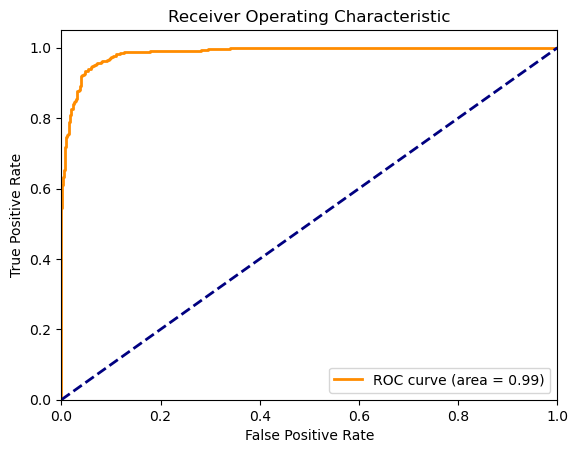

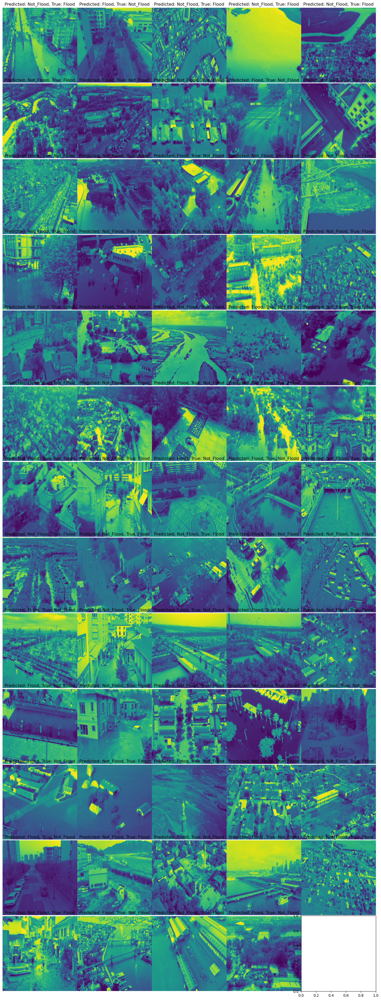

Area Under Curve (AUC): 0.9860


In [8]:
def test_model(model, test_loader, device):
    model.load_state_dict(torch.load('best_weights_resnet50.pth'))
    model.eval()

    correct = 0
    total = 0
    all_labels = []
    all_preds = []
    all_probs = []  # Tanımlanması gereken liste
    misclassified_images = []
    misclassified_labels = []
    misclassified_preds = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())
            all_probs.extend(outputs[:, 1].cpu().numpy()) 
            
            misclassified_idx = predicted != labels
            misclassified_images.extend(inputs[misclassified_idx])
            misclassified_labels.extend(labels[misclassified_idx])
            misclassified_preds.extend(predicted[misclassified_idx])

    test_accuracy = correct / total
    print('Test Accuracy: {:.2f}%'.format(test_accuracy * 100))

    conf_mat = confusion_matrix(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')
    precision = precision_score(all_labels, all_preds, average='weighted')

    print("Confusion Matrix:")
    print(conf_mat)
    print("F1 Score: {:.4f}".format(f1))
    print("Recall: {:.4f}".format(recall))
    print("Precision: {:.4f}".format(precision))

    fpr, tpr, _ = roc_curve(all_labels, all_probs)
    roc_auc = roc_auc_score(all_labels, all_probs)

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

    num_misclassified = len(misclassified_images)
    num_rows = int(np.ceil(num_misclassified / 5))
    fig, axes = plt.subplots(num_rows, 5, figsize=(15, 3 * num_rows))
    axes = axes.ravel()

    for i in range(num_misclassified):
        image = misclassified_images[i].cpu().numpy().transpose(1, 2, 0)
        true_label = class_names[misclassified_labels[i].item()]
        pred_label = class_names[misclassified_preds[i].item()]
        axes[i].imshow(image)
        axes[i].set_title("Predicted: {}, True: {}".format(pred_label, true_label))
        axes[i].axis('off')

        if i == num_rows * 5 - 1:
            break

    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

    return roc_auc

auc_value = test_model(resnet50, test_loader, device)
print("Area Under Curve (AUC): {:.4f}".format(auc_value))

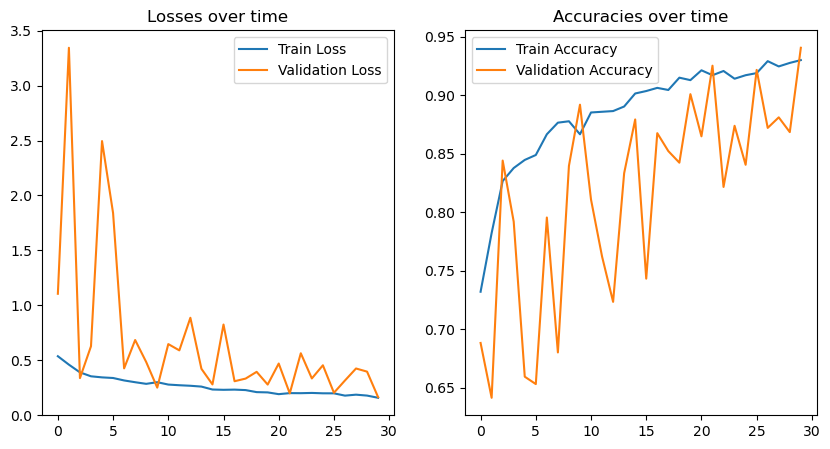

In [9]:
num_epochs = 30


plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.plot(range(num_epochs), train_losses, label='Train Loss')
plt.plot(range(num_epochs), val_losses, label='Validation Loss')
plt.legend()
plt.title('Losses over time')

plt.subplot(1, 2, 2)
plt.plot(range(num_epochs), train_accuracies, label='Train Accuracy')
plt.plot(range(num_epochs), val_accuracies, label='Validation Accuracy')
plt.legend()
plt.title('Accuracies over time')

plt.show()


In [10]:
def predict_image(img, model, device):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485], std=[0.229])  # apply normalization for single channel image
    ])

    img_tensor = transform(img.convert('L')).unsqueeze(0).to(device)
    start_time = time.time()
    
    with torch.no_grad():
        model.eval()
        output = model(img_tensor)
        _, predicted = torch.max(output.data, 1)
    
     # End time
    end_time = time.time()
    
    # Calculate the time taken to predict the image
    time_taken = end_time - start_time
    
    return predicted.item(), time_taken 

Prediction: Not_Flood
Time taken to predict the image: 0.19 seconds


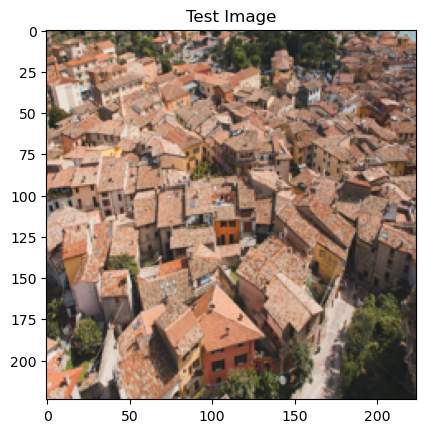

In [11]:
prediction, time_taken = predict_image(img, resnet50, device)
print("Prediction:", class_names[prediction])
print("Time taken to predict the image: {:.2f} seconds".format(time_taken))

# To display the image
plt.imshow(img)
plt.title('Test Image')
plt.show()

Prediction: Flood
Time taken to process the image: 0.13 seconds


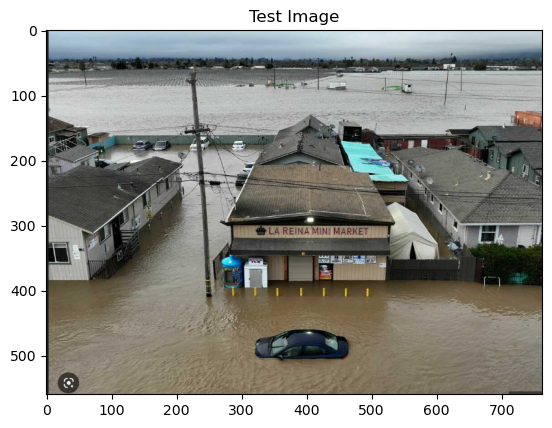

In [12]:
resnet50.load_state_dict(torch.load('best_weights_resnet50.pth'))
resnet50.eval()

new_image_path = "sel6.png"
img = Image.open(new_image_path)
prediction, time_taken = predict_image(img, resnet50, device)
predicted_class = class_names[prediction]
print("Prediction:", predicted_class)
print("Time taken to process the image: {:.2f} seconds".format(time_taken))

# To display the image
plt.imshow(img)
plt.title('Test Image')
plt.show()
